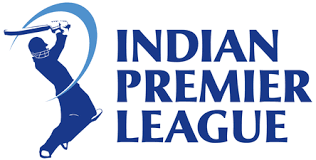

# Data Analysis and Visualization of IPL

### IPL Introduction

Setting a legendary milestone in the world of cricket, the BCCI created IPL. The exact combination of sports and entertainment to its fullest as to attract most of the audiences even the once who have never watched cricket before the beginning of the IPL in 2008.
For further information [click here](https://en.wikipedia.org/wiki/Indian_Premier_League)

The contents of the following analysis is as shown:

* **[Team stats](#team_stats)**
    1. Matches played in each city
    2. Number of times each team scored more than 200
    3. Toss win vs match win
    4. Number of IPL titles won by each team
    5. Season winners
    6. Win percentage

* **[Batsman stats]()**
    1. Best batsman
    2. Number of centuries scored by a player
    3. Number of half centuries sored by a player
    4. Number of sixes hit by a player
    5. Number of boundaries hit by a player

* **[Bowler stats]()**
    1. Best bowler
    2. Best bowling average

* **[Fielding stats]()**
    1. Most catches caught by a player
    2. Number of run outs made by a player

* **[Man of the matches]()**

* **[D/L method applied]()**

In [14]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
df = pd.read_csv("deliveries.csv",squeeze = True)
data = pd.read_csv("matches.csv",squeeze = True)
df["batting_team"]= df["batting_team"].astype("str")

<a id="team_stats"></a>
## Team Stats

### Matches played in each city

*IPL is held throughout in India in various cities. Fans are like 12th man of any team, so playing in home ground for any team gives enoromous amount of boost to the players. Due to some inconvinience IPL was held in* *<u>South Africa</u>* *in 2009 and in* *<u>Dubai</u>* *in 2014. Maximum number of matches played in each city is sorted and represented.*

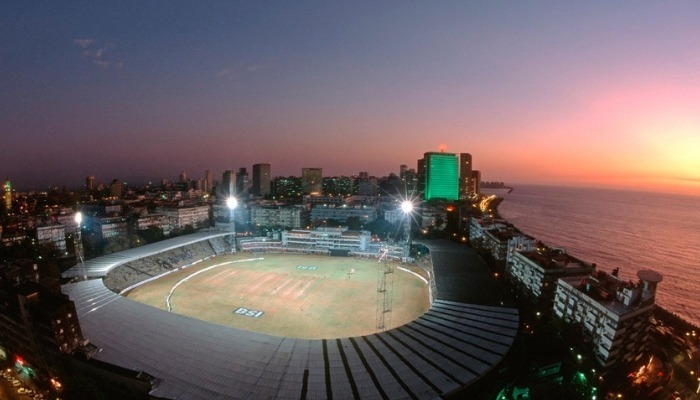

*Most matches are played in mumbai. Also India lifted the 2nd world cup.* 

D:\anaconda\lib\site-packages\seaborn\categorical.py:3692: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



Text(0.5, 1.0, 'no of matches played in each city')

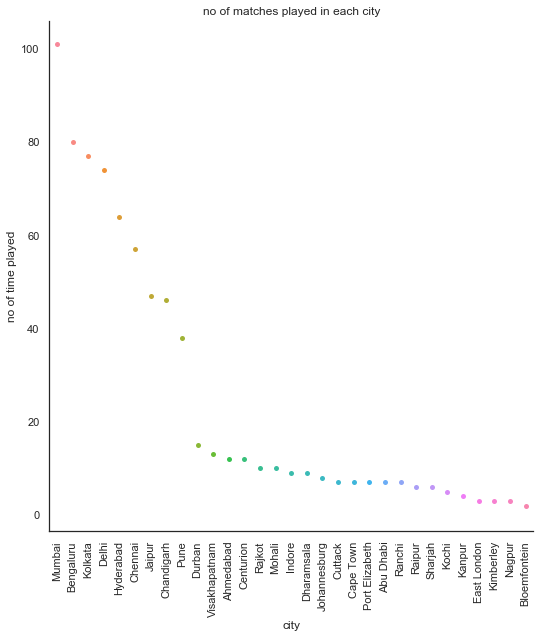

In [15]:
see=data["city"].value_counts().reset_index()
see = data['city'].apply(lambda x: str(x))
see = data['city'].apply(lambda x: "Bengaluru" if x =="Bangalore" else x)
see=see.value_counts().reset_index()
see.columns=["city","no of time played"]
sns.set(style="white")
sns.catplot(x="city",y="no of time played",data=see,kind="swarm",size =8);
plt.xticks(rotation=90)
plt.title("no of matches played in each city")

### Number of times each team scored more than 200

*IPL has legendary players in each and every team and each one of them try to get a solid score for their team. Scoring 200 was like mirale before the start of IPL and also is initial stages of the IPL.*

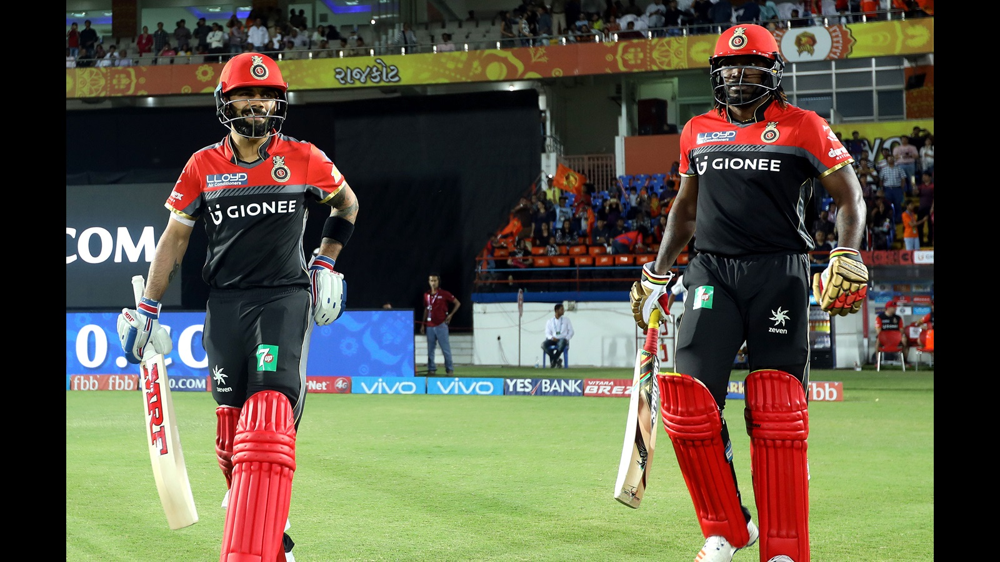

*The team with most number of 200 or more score is none other than the fantasy team RCB, it is the team which is loaded with the best T20 batsmens in the world. The teams having scores more than 200 is filtered and represented.*

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10], <a list of 11 Text xticklabel objects>)

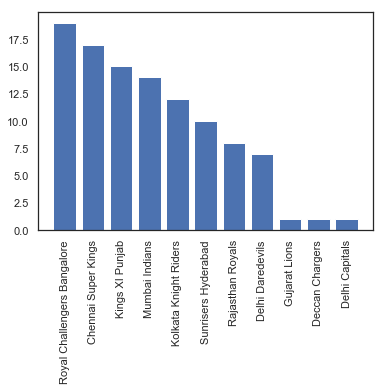

In [16]:
deliveries = pd.read_csv('deliveries.csv')
matches = pd.read_csv('matches.csv')
high_scores=deliveries.groupby(['match_id', 'inning','batting_team','bowling_team'])['total_runs'].sum().reset_index() 
high_scores=high_scores[high_scores['total_runs']>=200]
high_scores.nlargest(11415,'total_runs')
k= high_scores["batting_team"].value_counts().reset_index()
k.columns=["Team","No of times scored 200 or more"]
plt.bar("Team","No of times scored 200 or more",data=k)
plt.xticks(rotation=90)

### Toss win vs Matches win

*Winning toss will also influence the confidence of the team. Initial win makes the team bit more confident. Winning is quiet crcuial in some condition, as the condition changes it gets tough. The win and loss percentage is representsed in the pie chart*

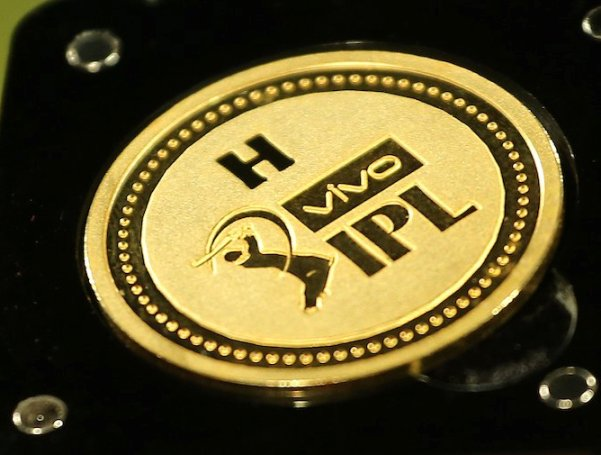

In [17]:
import plotly.graph_objects as go
tw=data["toss_winner"].value_counts().sum()
win_toss_win_match=data[(data['toss_winner'] == data['winner'])]
df = pd.DataFrame({"Team won the toss":[ win_toss_win_match.shape[0],]}, index = ['Won match']).reset_index()
percentage=(df["Team won the toss"]/tw)*100
labels=["won","lost"]
values=["393","360"]
d=[go.Pie(labels=labels,values=values)]
fig=go.Figure(d)
fig.show()

### Number of IPL titles won by each team

*Out of the thirteen teams that have played in the Indian Premier League since its inception, one team has won the competition fout times, one team has won the competition thrice, one team has won the competition twice and three other teams have won it once. Mumbai Indians are the most successful team in league's history in terms of the number of titles won. The Chennai Super Kings have won 3 titles, the Kolkata Knight Riders have won two titles, and the other three teams who have won the tournament are the Deccan Chargers, Rajasthan Royals and Sunrisers Hyderabad. The current champions are Mumbai Indians who beat Chennai Super Kings in the final of the 2019 season to secure their fourth title and thus became the most successful team in IPL history ever.*

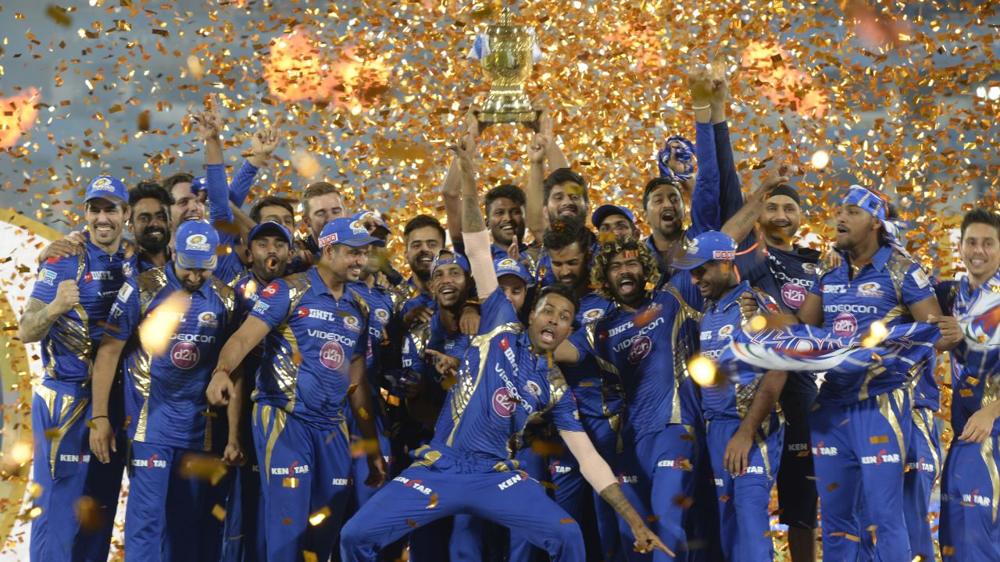

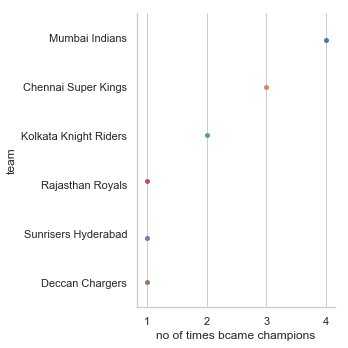

In [18]:
matches =pd.read_csv("matches.csv")
win_toss_win_match=data[(data['toss_winner'] == data['winner'])]
df = pd.DataFrame({"Team won the toss":[ win_toss_win_match.shape[0],]}, index = ['Won match'])
win_season=matches.drop_duplicates(subset=['season'],keep='last')[['season','winner']].reset_index(drop=True)
win_season=win_season['winner'].value_counts().reset_index()
win_season.columns=["team","no of times bcame champions"]
match=pd.read_csv('matches.csv')
sns.set_style("whitegrid")
sns.catplot(x="no of times bcame champions",y="team",data=win_season)

### Season winners

*How much ever strong every team might be,but at the end of the tournament the champions title is reserved only for one team. They win the IPL trophy of that year. The teams with maximum number of tropies are sorted and represented.*

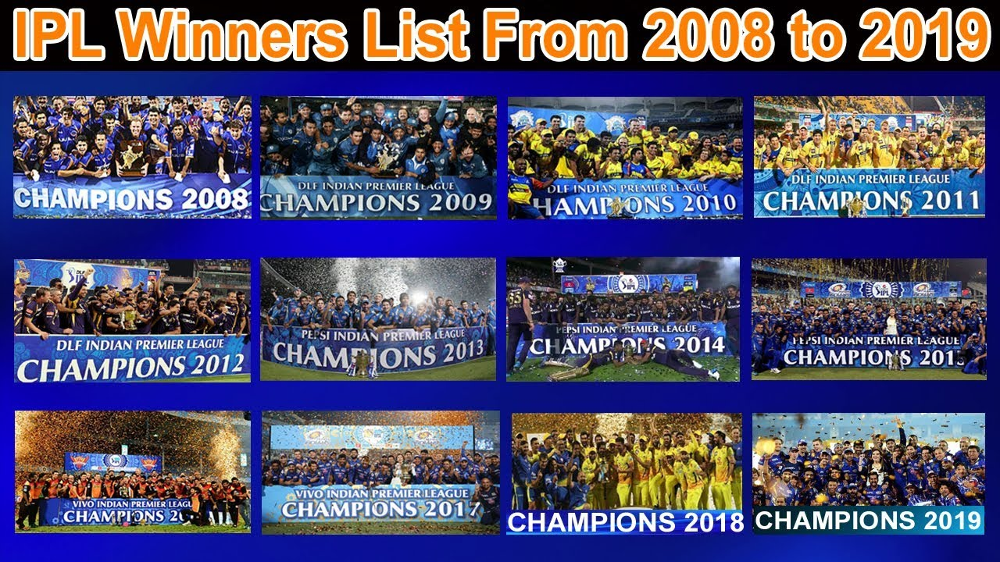

<BarContainer object of 12 artists>

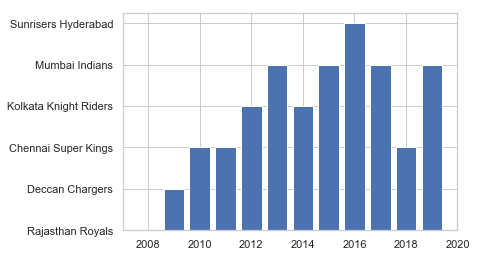

In [19]:
season_winners=data.groupby('season')['season','winner'].tail(1)
season_winners=season_winners.sort_values('season',ascending = True)
plt.bar("season","winner",data=season_winners)  

### Win percentage

*In IPL,win percentage refers to ratio of  total number of matches won by each team to the total number of matches won by each team.*

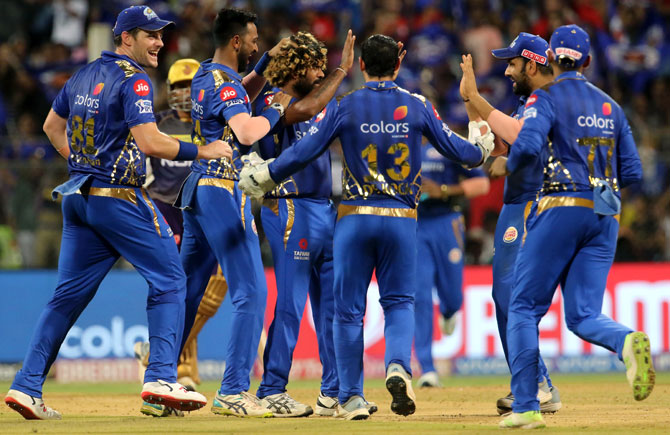

*Mumbai Indians is the team having maximun win percentage. Almost they won 3 matches out of every 5 matches.*

Text(0.5, 1.0, 'win percentage(%)')

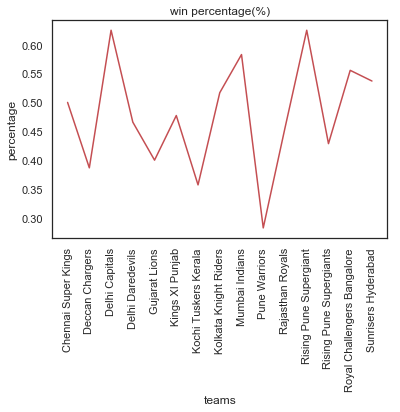

In [23]:
matches_played=pd.concat([data["team1"],data["team2"]])
matches_played=matches_played.value_counts().reset_index()
matches_played.columns=["teams","total mactches"]
matches_played["wins"]=data["winner"].value_counts().reset_index()["winner"]
percentage=matches_played["wins"]/matches_played["total mactches"]
matches_played["percentage"]=percentage
sns.set(style="white")
sns.lineplot(x="teams",y="percentage",data=matches_played,color="r");
plt.xticks(rotation=90)
plt.title("win percentage(%)")